# <center> M6 T01: Algoritmes d'aprenentatge No Supervisat: Agrupació

## Limpieza e Ingeniería
Vuelvo a realizar gran parte de los pasos de los anteriores ejercicios, pero con cambios, y con pasos adicionales.

In [1]:
# Importo algunas de las librerías que voy a utilizar:
import pandas
import numpy
import matplotlib.pyplot as plt
import seaborn as sbrn

In [2]:
# Configuro pandas para que no se oculten columnas:
#pandas.set_option('display.max_columns', None)

Importo el archivo CSV y elimino la columna '**Unnamed: 0**':

In [3]:
# Almaceno en un dataframe el csv:
flights = pandas.read_csv('./input/DelayedFlights.csv')

# Elimino la columna 'Unnamed: 0', correspondiente a los índices originales:
del(flights['Unnamed: 0'])

flights

,Year,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,FlightNum,...,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,2008,1,3,4,2003.0,1955,2211.0,2225,WN,335,...,4.0,8.0,0,N,0,NaN,NaN,NaN,NaN,NaN
1,2008,1,3,4,754.0,735,1002.0,1000,WN,3231,...,5.0,10.0,0,N,0,NaN,NaN,NaN,NaN,NaN
2,2008,1,3,4,628.0,620,804.0,750,WN,448,...,3.0,17.0,0,N,0,NaN,NaN,NaN,NaN,NaN
3,2008,1,3,4,1829.0,1755,1959.0,1925,WN,3920,...,3.0,10.0,0,N,0,2.0,0.0,0.0,0.0,32.0
4,2008,1,3,4,1940.0,1915,2121.0,2110,WN,378,...,4.0,10.0,0,N,0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936753,2008,12,13,6,1250.0,1220,1617.0,1552,DL,1621,...,9.0,18.0,0,N,0,3.0,0.0,0.0,0.0,22.0
1936754,2008,12,13,6,657.0,600,904.0,749,DL,1631,...,15.0,34.0,0,N,0,0.0,57.0,18.0,0.0,0.0
1936755,2008,12,13,6,1007.0,847,1149.0,1010,DL,1631,...,8.0,32.0,0,N,0,1.0,0.0,19.0,0.0,79.0
1936756,2008,12,13,6,1251.0,1240,1446.0,1437,DL,1639,...,13.0,13.0,0,N,0,NaN,NaN,NaN,NaN,NaN


En este ejercicio no tenemos que preocuparnos por las columnas de las que dispondremos (porque dispondremos de todas), pero esto determina otras dificultades, que deberemos solventar en las fases de limpieza y transformación.  
Para empezar, los registros que tienen valor **1** en las columnas **Cancelled** o **Diverted**, no tienen información en columnas básicas (como **ArrTime**, **ActualElapsedTime**, **AirTime**, **ArrDelay**, etc), así que elimino esos registros:

In [4]:
flights.drop(flights.query("Cancelled == 1 or Diverted == 1").index, inplace=True)

Elimino las columnas **Cancelled**, **CancellationCode**, y **Diverted**, que ahora solo tienen un valor único:

In [5]:
flights.drop(['Cancelled','CancellationCode','Diverted'], axis='columns', inplace=True)

Las columnas categóricas **FlightNum** y **TailNum** incluyen miles de valores únicos, por lo que es inviable crear columnas dummies en base a sus valores (además, solo identifican los vuelos, de forma casi unívoca), así que también las elimino:

In [6]:
flights.drop(['FlightNum','TailNum'], axis='columns', inplace=True)

Commpruebo los **valores null**, y veo que ahora solo hay en las 5 columnas que "descomponen" la variable **ArrDelay**:

In [7]:
flights.isna().sum()

Year                      0
Month                     0
DayofMonth                0
DayOfWeek                 0
DepTime                   0
CRSDepTime                0
ArrTime                   0
CRSArrTime                0
UniqueCarrier             0
ActualElapsedTime         0
CRSElapsedTime            0
AirTime                   0
ArrDelay                  0
DepDelay                  0
Origin                    0
Dest                      0
Distance                  0
TaxiIn                    0
TaxiOut                   0
CarrierDelay         680883
WeatherDelay         680883
NASDelay             680883
SecurityDelay        680883
LateAircraftDelay    680883
dtype: int64

En este caso, lo que haré es rellenar los valores **null** de esas columnas con **0**, que es el valor que les corresponde:

In [8]:
flights[['CarrierDelay','WeatherDelay','NASDelay','SecurityDelay','LateAircraftDelay']] = flights[['CarrierDelay','WeatherDelay','NASDelay','SecurityDelay','LateAircraftDelay']].fillna(0)

Elimino la columna **Year**, que solo tiene un valor:

In [9]:
flights.drop(['Year'], axis='columns', inplace=True)

Compruebo los tipos de datos:

In [10]:
flights.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1928371 entries, 0 to 1936757
Data columns (total 23 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Month              int64  
 1   DayofMonth         int64  
 2   DayOfWeek          int64  
 3   DepTime            float64
 4   CRSDepTime         int64  
 5   ArrTime            float64
 6   CRSArrTime         int64  
 7   UniqueCarrier      object 
 8   ActualElapsedTime  float64
 9   CRSElapsedTime     float64
 10  AirTime            float64
 11  ArrDelay           float64
 12  DepDelay           float64
 13  Origin             object 
 14  Dest               object 
 15  Distance           int64  
 16  TaxiIn             float64
 17  TaxiOut            float64
 18  CarrierDelay       float64
 19  WeatherDelay       float64
 20  NASDelay           float64
 21  SecurityDelay      float64
 22  LateAircraftDelay  float64
dtypes: float64(14), int64(6), object(3)
memory usage: 353.1+ MB


Convierto a tipo de datos **int64** las columnas que tienen tipo de datos **float64** (que en realidad no tienen decimales):

In [11]:
# Almaceno los nombres de las columnas con tipo de datos "float64":
float_cols = flights.select_dtypes(include=['float64']).columns

# Convierto el tipo de datos de esas columnas a "int64":
flights[float_cols] = flights[float_cols].astype('int64')

Vuelvo a hacer "ingeniería manual" sobre las columnas **DepTime** y **CRSArrTime** (y también sobre **ArrTime**, que esta vez la conservo), para solucionar el problema del reseteo de hora al cambiar el día:

In [12]:
# Necesito importar esta libreria para obtener el numero de dígitos de los valores de las columnas:
import math

# Itero los índices del dataframe:
for ind in flights.index:

    # Compruebo si 'DepTime' es menor que'CRSDepTime', y 'DepDelay' es mayor que "1440":
    if (flights.at[ind,'DepTime'] < flights.at[ind,'CRSDepTime']) & (flights.at[ind,'DepDelay'] >= 1440):
        
        # Modifico el valor de la columna 'DepTime', de una forma u otra dependiendo de la cantidad de dígitos que tenga:
        if flights.at[ind,'DepTime'] == 0:
            flights.at[ind,'DepTime'] = int("480" + str(flights.at[ind,'DepTime']))
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 1:
            flights.at[ind,'DepTime'] = int("480" + str(flights.at[ind,'DepTime']))
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 2:
            flights.at[ind,'DepTime'] = int("48" + str(flights.at[ind,'DepTime']))
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 3:
            flights.at[ind,'DepTime'] = int(str(48 + int(str(flights.at[ind,'DepTime'])[0])) + str(flights.at[ind,'DepTime'])[1:])
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 4:
            flights.at[ind,'DepTime'] = int(str(48 + int(str(flights.at[ind,'DepTime'])[0:2])) + str(flights.at[ind,'DepTime'])[2:])
            
        # Modifico el valor de la columna 'CRSArrTime', de una forma u otra dependiendo de la cantidad de dígitos que tenga:
        if flights.at[ind,'CRSArrTime'] == 0:
            flights.at[ind,'CRSArrTime'] = int("480" + str(flights.at[ind,'CRSArrTime']))
        elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 1:
            flights.at[ind,'CRSArrTime'] = int("480" + str(flights.at[ind,'CRSArrTime']))
        elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 2:
            flights.at[ind,'CRSArrTime'] = int("48" + str(flights.at[ind,'CRSArrTime']))
        elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 3:
            flights.at[ind,'CRSArrTime'] = int(str(48 + int(str(flights.at[ind,'CRSArrTime'])[0])) + str(flights.at[ind,'CRSArrTime'])[1:])
        #elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 4:
            #flights.at[ind,'CRSArrTime'] = int(str(48 + int(str(flights.at[ind,'CRSArrTime'])[0:2])) + str(flights.at[ind,'CRSArrTime'])[2:])

        # Modifico el valor de la columna 'ArrTime', de una forma u otra dependiendo de la cantidad de dígitos que tenga:
        if flights.at[ind,'ArrTime'] == 0:
            flights.at[ind,'ArrTime'] = int("480" + str(flights.at[ind,'ArrTime']))
        elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 1:
            flights.at[ind,'ArrTime'] = int("480" + str(flights.at[ind,'ArrTime']))
        elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 2:
            flights.at[ind,'ArrTime'] = int("48" + str(flights.at[ind,'ArrTime']))
        elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 3:
            flights.at[ind,'ArrTime'] = int(str(48 + int(str(flights.at[ind,'ArrTime'])[0])) + str(flights.at[ind,'ArrTime'])[1:])
        #elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 4:
            #flights.at[ind,'ArrTime'] = int(str(48 + int(str(flights.at[ind,'ArrTime'])[0:2])) + str(flights.at[ind,'ArrTime'])[2:])
            
    # Compruebo si 'DepTime' es menor que'CRSDepTime', y 'DepDelay' es menor que "1440":
    elif (flights.at[ind,'DepTime'] < flights.at[ind,'CRSDepTime']) & (flights.at[ind,'DepDelay'] < 1440):
        
        # Modifico el valor de la columna 'DepTime', de una forma u otra dependiendo de la cantidad de dígitos que tenga:
        if flights.at[ind,'DepTime'] == 0:
            flights.at[ind,'DepTime'] = int("240" + str(flights.at[ind,'DepTime']))
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 1:
            flights.at[ind,'DepTime'] = int("240" + str(flights.at[ind,'DepTime']))
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 2:
            flights.at[ind,'DepTime'] = int("24" + str(flights.at[ind,'DepTime']))
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 3:
            flights.at[ind,'DepTime'] = int(str(24 + int(str(flights.at[ind,'DepTime'])[0])) + str(flights.at[ind,'DepTime'])[1:])
        elif int(math.log10(flights.at[ind,'DepTime']) + 1) == 4:
            flights.at[ind,'DepTime'] = int(str(24 + int(str(flights.at[ind,'DepTime'])[0:2])) + str(flights.at[ind,'DepTime'])[2:])

        # Modifico el valor de la columna 'CRSArrTime', de una forma u otra dependiendo de la cantidad de dígitos que tenga:
        if flights.at[ind,'CRSArrTime'] == 0:
            flights.at[ind,'CRSArrTime'] = int("240" + str(flights.at[ind,'CRSArrTime']))
        elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 1:
            flights.at[ind,'CRSArrTime'] = int("240" + str(flights.at[ind,'CRSArrTime']))
        elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 2:
            flights.at[ind,'CRSArrTime'] = int("24" + str(flights.at[ind,'CRSArrTime']))
        elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 3:
            flights.at[ind,'CRSArrTime'] = int(str(24 + int(str(flights.at[ind,'CRSArrTime'])[0])) + str(flights.at[ind,'CRSArrTime'])[1:])
        #elif int(math.log10(flights.at[ind,'CRSArrTime']) + 1) == 4:
            #flights.at[ind,'CRSArrTime'] = int(str(24 + int(str(flights.at[ind,'CRSArrTime'])[0:2])) + str(flights.at[ind,'CRSArrTime'])[2:])

        # Modifico el valor de la columna 'ArrTime', de una forma u otra dependiendo de la cantidad de dígitos que tenga:
        if flights.at[ind,'ArrTime'] == 0:
            flights.at[ind,'ArrTime'] = int("240" + str(flights.at[ind,'ArrTime']))
        elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 1:
            flights.at[ind,'ArrTime'] = int("240" + str(flights.at[ind,'ArrTime']))
        elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 2:
            flights.at[ind,'ArrTime'] = int("24" + str(flights.at[ind,'ArrTime']))
        elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 3:
            flights.at[ind,'ArrTime'] = int(str(24 + int(str(flights.at[ind,'ArrTime'])[0])) + str(flights.at[ind,'ArrTime'])[1:])
        #elif int(math.log10(flights.at[ind,'ArrTime']) + 1) == 4:
            #flights.at[ind,'ArrTime'] = int(str(24 + int(str(flights.at[ind,'ArrTime'])[0:2])) + str(flights.at[ind,'ArrTime'])[2:])
            
flights

,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,ActualElapsedTime,CRSElapsedTime,...,Origin,Dest,Distance,TaxiIn,TaxiOut,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,1,3,4,2003,1955,2211,2225,WN,128,150,...,IAD,TPA,810,4,8,0,0,0,0,0
1,1,3,4,754,735,1002,1000,WN,128,145,...,IAD,TPA,810,5,10,0,0,0,0,0
2,1,3,4,628,620,804,750,WN,96,90,...,IND,BWI,515,3,17,0,0,0,0,0
3,1,3,4,1829,1755,1959,1925,WN,90,90,...,IND,BWI,515,3,10,2,0,0,0,32
4,1,3,4,1940,1915,2121,2110,WN,101,115,...,IND,JAX,688,4,10,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1936753,12,13,6,1250,1220,1617,1552,DL,147,152,...,MSP,ATL,906,9,18,3,0,0,0,22
1936754,12,13,6,657,600,904,749,DL,127,109,...,RIC,ATL,481,15,34,0,57,18,0,0
1936755,12,13,6,1007,847,1149,1010,DL,162,143,...,ATL,IAH,689,8,32,1,0,19,0,79
1936756,12,13,6,1251,1240,1446,1437,DL,115,117,...,IAD,ATL,533,13,13,0,0,0,0,0


Guardo el nuevo dataframe en un CSV (esta vez con nombre **DelayedFlights_clean3.csv**), para poder hacer diferentes pruebas a partir de este punto con más facilidad:

In [13]:
flights.to_csv('./output/DelayedFlights_clean3.csv', index=False)

---

## Transformación
En esta sección escalaré las columnas numéricas con **StandardScaler**, y codificaré las columnas categóricas con **get_dummies**. Además, convertiré en categóricas las columnas **DayOfWeek** y **Month**, y también las codificaré como columnas dummies.

In [53]:
# Importo el dataframe "flights_clean" (que en este caso está guardado como "DelayedFlights_clean3.csv":
flights_clean = pandas.read_csv('./output/DelayedFlights_clean3.csv')

In [54]:
# Importo la función "StandardScaler":
from sklearn.preprocessing import StandardScaler

# Almaceno en una lista las columnas con valores numéricos (todas tienen tipo de datos "int64"):
int_cols = flights_clean.select_dtypes(include=['int64']).columns

# Uso la función "fit_transform" para escalar las variables almacenadas en "int_cols":
scaled_std = StandardScaler().fit_transform(flights_clean[int_cols])

# Guardo los resultados en un dataframe:
flights_num_std = pandas.DataFrame(scaled_std, columns=int_cols)

flights_num_std

,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Distance,TaxiIn,TaxiOut,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,-1.467457,-1.452968,0.007515,1.056346,1.147281,1.063407,1.249425,-0.073631,0.221839,0.112508,-0.989701,-0.658801,0.078502,-0.533668,-0.714080,-0.342706,-0.137874,-0.345293,-0.035829,-0.455575
1,-1.467457,-1.452968,0.007515,-1.783886,-1.725146,-1.146449,-1.386213,-0.073631,0.151647,0.068804,-0.707935,-0.452290,0.078502,-0.343844,-0.574302,-0.342706,-0.137874,-0.345293,-0.035829,-0.455575
2,-1.467457,-1.452968,0.007515,-2.070411,-1.995907,-1.508360,-1.924098,-0.517705,-0.620463,-0.470220,-0.496611,-0.658801,-0.435537,-0.723491,-0.085078,-0.342706,-0.137874,-0.345293,-0.035829,-0.455575
3,-1.467457,-1.452968,0.007515,0.660669,0.676392,0.602792,0.603962,-0.600969,-0.620463,-0.455652,-0.144403,-0.170685,-0.435537,-0.723491,-0.574302,-0.287464,-0.137874,-0.345293,-0.035829,0.435274
4,-1.467457,-1.452968,0.007515,0.913084,1.053104,0.898902,1.001997,-0.448319,-0.269504,-0.309970,-0.549442,-0.339648,-0.134084,-0.533668,-0.574302,-0.342706,-0.137874,-0.345293,-0.035829,-0.455575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,1.692779,-0.313570,1.009494,-0.655980,-0.583238,-0.022328,-0.198562,0.190038,0.249916,0.170781,-0.302896,-0.245780,0.245783,0.415450,-0.015189,-0.259843,-0.137874,-0.345293,-0.035829,0.156884
1928367,1.692779,-0.313570,1.009494,-2.004465,-2.042996,-1.325577,-1.926250,-0.087508,-0.353734,-0.441084,0.577622,0.261110,-0.494783,1.554392,1.103037,-0.342706,3.142265,0.294290,-0.035829,-0.455575
1928368,1.692779,-0.313570,1.009494,-1.208563,-1.461447,-0.877756,-1.364698,0.398198,0.123570,0.199917,1.000271,0.692906,-0.132341,0.225627,0.963259,-0.315085,-0.137874,0.329823,-0.035829,1.743709
1928369,1.692779,-0.313570,1.009494,-0.653706,-0.536149,-0.334889,-0.445990,-0.254036,-0.241427,-0.280834,-0.584662,-0.602480,-0.404172,1.174744,-0.364634,-0.342706,-0.137874,-0.345293,-0.035829,-0.455575


In [55]:
# Almaceno en un diccionario las correspondencias "Numero_Dia : Nombre_Dia":
day_dict = {1:'Monday', 2:'Tuesday', 3:'Wednesday', 4:'Thursday', 5:'Friday', 6:'Saturday', 7:'Sunday'}

# Convierto los valores de la columna 'DayOfWeek' en categóricos, mediante la función "map" y el diccionario "day_dict":
flights_clean['DayOfWeek'] = flights_clean['DayOfWeek'].map(day_dict)

In [56]:
# Almaceno en un diccionario las correspondencias "Numero_Mes : Nombre_Mes":
month_dict = {1:'January', 2:'February', 3:'March', 4:'April', 5:'May', 6:'June', 7:'July', 8:'August', 9:'September', 10:'October', 11:'November', 12:'December'}

# Convierto los valores de la columna 'Month' en categóricos, mediante la función "map" y el diccionario "month_dict":
flights_clean['Month'] = flights_clean['Month'].map(month_dict)

flights_clean

,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,ActualElapsedTime,CRSElapsedTime,...,Origin,Dest,Distance,TaxiIn,TaxiOut,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,January,3,Thursday,2003,1955,2211,2225,WN,128,150,...,IAD,TPA,810,4,8,0,0,0,0,0
1,January,3,Thursday,754,735,1002,1000,WN,128,145,...,IAD,TPA,810,5,10,0,0,0,0,0
2,January,3,Thursday,628,620,804,750,WN,96,90,...,IND,BWI,515,3,17,0,0,0,0,0
3,January,3,Thursday,1829,1755,1959,1925,WN,90,90,...,IND,BWI,515,3,10,2,0,0,0,32
4,January,3,Thursday,1940,1915,2121,2110,WN,101,115,...,IND,JAX,688,4,10,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,December,13,Saturday,1250,1220,1617,1552,DL,147,152,...,MSP,ATL,906,9,18,3,0,0,0,22
1928367,December,13,Saturday,657,600,904,749,DL,127,109,...,RIC,ATL,481,15,34,0,57,18,0,0
1928368,December,13,Saturday,1007,847,1149,1010,DL,162,143,...,ATL,IAH,689,8,32,1,0,19,0,79
1928369,December,13,Saturday,1251,1240,1446,1437,DL,115,117,...,IAD,ATL,533,13,13,0,0,0,0,0


In [57]:
# Codifico los valores de la columna 'UniqueCarrier':
flights_dumm_carrier = pandas.get_dummies(flights_clean['UniqueCarrier'], prefix='Carrier')

flights_dumm_carrier

,Carrier_9E,Carrier_AA,Carrier_AQ,Carrier_AS,Carrier_B6,Carrier_CO,Carrier_DL,Carrier_EV,Carrier_F9,Carrier_FL,Carrier_HA,Carrier_MQ,Carrier_NW,Carrier_OH,Carrier_OO,Carrier_UA,Carrier_US,Carrier_WN,Carrier_XE,Carrier_YV
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1928367,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1928368,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1928369,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [58]:
# Codifico los valores de la columna 'Origin':
flights_dumm_origin = pandas.get_dummies(flights_clean['Origin'], prefix='Origin')

flights_dumm_origin

,Origin_ABE,Origin_ABI,Origin_ABQ,Origin_ABY,Origin_ACK,Origin_ACT,Origin_ACV,Origin_ACY,Origin_ADK,Origin_ADQ,...,Origin_TYR,Origin_TYS,Origin_VLD,Origin_VPS,Origin_WRG,Origin_WYS,Origin_XNA,Origin_YAK,Origin_YKM,Origin_YUM
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1928367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1928368,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1928369,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [59]:
# Codifico los valores de la columna 'Dest':
flights_dumm_dest = pandas.get_dummies(flights_clean['Dest'], prefix='Dest')

flights_dumm_dest

,Dest_ABE,Dest_ABI,Dest_ABQ,Dest_ABY,Dest_ACK,Dest_ACT,Dest_ACV,Dest_ACY,Dest_ADK,Dest_ADQ,...,Dest_TYR,Dest_TYS,Dest_VLD,Dest_VPS,Dest_WRG,Dest_WYS,Dest_XNA,Dest_YAK,Dest_YKM,Dest_YUM
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1928367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1928368,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1928369,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [60]:
# Codifico los valores de la columna 'Month':
flights_dumm_month = pandas.get_dummies(flights_clean['Month'], prefix='Month')

flights_dumm_month

,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September
0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,0,0,1,0,0,0,0,0,0,0,0,0
1928367,0,0,1,0,0,0,0,0,0,0,0,0
1928368,0,0,1,0,0,0,0,0,0,0,0,0
1928369,0,0,1,0,0,0,0,0,0,0,0,0


In [61]:
# Codifico los valores de la columna 'DayOfWeek':
flights_dumm_day = pandas.get_dummies(flights_clean['DayOfWeek'], prefix='Day')

flights_dumm_day

,Day_Friday,Day_Monday,Day_Saturday,Day_Sunday,Day_Thursday,Day_Tuesday,Day_Wednesday
0,0,0,0,0,1,0,0
1,0,0,0,0,1,0,0
2,0,0,0,0,1,0,0
3,0,0,0,0,1,0,0
4,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...
1928366,0,0,1,0,0,0,0
1928367,0,0,1,0,0,0,0
1928368,0,0,1,0,0,0,0
1928369,0,0,1,0,0,0,0


In [62]:
# Concateno los 6 datqframes, para construir el dataframe sobre el que ejecutaré los modelos de Machine Learning:
flights_transf = pandas.concat([flights_num_std, flights_dumm_carrier, flights_dumm_origin, flights_dumm_dest, flights_dumm_month, flights_dumm_day], axis='columns')

flights_transf

,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,ActualElapsedTime,CRSElapsedTime,AirTime,...,Month_November,Month_October,Month_September,Day_Friday,Day_Monday,Day_Saturday,Day_Sunday,Day_Thursday,Day_Tuesday,Day_Wednesday
0,-1.467457,-1.452968,0.007515,1.056346,1.147281,1.063407,1.249425,-0.073631,0.221839,0.112508,...,0,0,0,0,0,0,0,1,0,0
1,-1.467457,-1.452968,0.007515,-1.783886,-1.725146,-1.146449,-1.386213,-0.073631,0.151647,0.068804,...,0,0,0,0,0,0,0,1,0,0
2,-1.467457,-1.452968,0.007515,-2.070411,-1.995907,-1.508360,-1.924098,-0.517705,-0.620463,-0.470220,...,0,0,0,0,0,0,0,1,0,0
3,-1.467457,-1.452968,0.007515,0.660669,0.676392,0.602792,0.603962,-0.600969,-0.620463,-0.455652,...,0,0,0,0,0,0,0,1,0,0
4,-1.467457,-1.452968,0.007515,0.913084,1.053104,0.898902,1.001997,-0.448319,-0.269504,-0.309970,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,1.692779,-0.313570,1.009494,-0.655980,-0.583238,-0.022328,-0.198562,0.190038,0.249916,0.170781,...,0,0,0,0,0,1,0,0,0,0
1928367,1.692779,-0.313570,1.009494,-2.004465,-2.042996,-1.325577,-1.926250,-0.087508,-0.353734,-0.441084,...,0,0,0,0,0,1,0,0,0,0
1928368,1.692779,-0.313570,1.009494,-1.208563,-1.461447,-0.877756,-1.364698,0.398198,0.123570,0.199917,...,0,0,0,0,0,1,0,0,0,0
1928369,1.692779,-0.313570,1.009494,-0.653706,-0.536149,-0.334889,-0.445990,-0.254036,-0.241427,-0.280834,...,0,0,0,0,0,1,0,0,0,0


---

## Reducción de Dimensiones con PCA  
En esta sección probaré la reduccion de dimensiones con la técnica **PCA**, aprovechando que forma parte de éste módulo, y teniendo en cuenta que el dataframe que estoy utilizando tiene ahora más columnas que en todos los ejercicios anteriores, lo que seguramente repercutirá negativamente en el tiempo de ejecución de los modelos.

Hago una prueba de reducción de dimensiones, inicialmente a **100**, para comprobar si mantiene suficiente información:

In [63]:
# Importo la función "PCA":
from sklearn.decomposition import PCA

# Creo una instancia de "PCA", especificando que reduzca las columnas a "100":
pca = PCA(n_components=100)

# Aplico el objeto "PCA" sobre el dataframe:
pca_comps = pca.fit_transform(flights_transf)

Imprimo la suma de los valores que devuelve el atributo **explained_variance_ratio_**, para verificar cuanta información se ha conservado:

In [64]:
pca.explained_variance_ratio_.sum()

0.9698955029135711

Hago un gráfico para comprobar la cantidad de componentes que en este caso es más adecuado mantener:

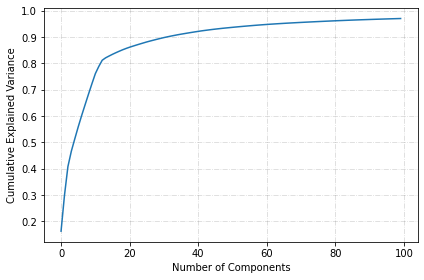

In [65]:
plt.plot(numpy.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(axis='both', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Tomo la decisión de mantener **60** componentes, así que vuelvo a ejecutar la función **PCA**, con esa configuración:

In [66]:
# Creo una instancia de "PCA", especificando que reduzca las columnas a "50":
pca = PCA(n_components=60)

# Aplico el objeto "PCA" sobre el dataframe:
pca_comps = pca.fit_transform(flights_transf)

Vuelvo a imprimir la suma de los valores que devuelve el atributo **explained_variance_ratio_**, para verificar cuanta información se ha conservado con esta nueva configuración (creo que un **94%** es aceptable):

In [67]:
pca.explained_variance_ratio_.sum()

0.9464729387529106

Construyo los nombres de las columnas, mediante un bucle **for** y el tipo de datos **range**, y los almaceno en una lista:

In [68]:
# Declaro una lista vacía, para almacenar los nombres de las columnas:
col_names = []

# Itero un rango de números de "1" a "60", y por cada uno construyo el nombre de una columna
#   (concatenando "Comp_" al número actual), y lo almaceno en la lista "col_names":
for num in range(1, 61):
    col_names.append("Comp_" + str(num))

col_names

['Comp_1',
 'Comp_2',
 'Comp_3',
 'Comp_4',
 'Comp_5',
 'Comp_6',
 'Comp_7',
 'Comp_8',
 'Comp_9',
 'Comp_10',
 'Comp_11',
 'Comp_12',
 'Comp_13',
 'Comp_14',
 'Comp_15',
 'Comp_16',
 'Comp_17',
 'Comp_18',
 'Comp_19',
 'Comp_20',
 'Comp_21',
 'Comp_22',
 'Comp_23',
 'Comp_24',
 'Comp_25',
 'Comp_26',
 'Comp_27',
 'Comp_28',
 'Comp_29',
 'Comp_30',
 'Comp_31',
 'Comp_32',
 'Comp_33',
 'Comp_34',
 'Comp_35',
 'Comp_36',
 'Comp_37',
 'Comp_38',
 'Comp_39',
 'Comp_40',
 'Comp_41',
 'Comp_42',
 'Comp_43',
 'Comp_44',
 'Comp_45',
 'Comp_46',
 'Comp_47',
 'Comp_48',
 'Comp_49',
 'Comp_50',
 'Comp_51',
 'Comp_52',
 'Comp_53',
 'Comp_54',
 'Comp_55',
 'Comp_56',
 'Comp_57',
 'Comp_58',
 'Comp_59',
 'Comp_60']

Creo el dataframe que utilizaré para probar los modelos de Machine Learning, con los componentes devueltos por la función **PCA**, y los nombres de columnas almacenados en la lista **col_names**:

In [69]:
flights_scaled_pca = pandas.DataFrame(data= pca_comps, columns= col_names)

flights_scaled_pca

,Comp_1,Comp_2,Comp_3,Comp_4,Comp_5,Comp_6,Comp_7,Comp_8,Comp_9,Comp_10,...,Comp_51,Comp_52,Comp_53,Comp_54,Comp_55,Comp_56,Comp_57,Comp_58,Comp_59,Comp_60
0,-0.058119,0.745146,-2.653883,0.380449,-0.748011,1.867500,0.160428,0.148122,-0.084642,0.615251,...,0.008055,-0.107457,-0.069777,0.029402,-0.093946,-0.071299,-0.033652,-0.042568,-0.022391,-0.024176
1,-0.139812,-3.097157,0.945158,0.512717,-0.646282,1.867457,-0.473894,-0.048409,-0.166373,0.590445,...,0.015307,-0.091033,-0.075949,0.030361,-0.089678,-0.054634,-0.030980,-0.079164,-0.027289,-0.031018
2,-1.250322,-3.521945,1.548636,0.228260,-0.664572,1.923892,-0.511360,0.103505,-0.136805,0.362005,...,0.024963,0.031932,-0.010954,-0.019648,-0.032722,-0.040834,-0.030824,-0.007830,0.049779,-0.071074
3,-1.226229,0.837477,-1.177738,0.639889,-0.775349,1.821015,-0.478946,-0.061084,-0.104812,0.480770,...,0.015391,0.029597,-0.007318,-0.019292,-0.038273,-0.052202,-0.024126,0.028918,0.059643,-0.065356
4,-0.760781,0.847287,-2.042890,0.326579,-0.742746,1.876374,0.132385,0.141411,-0.079088,0.589082,...,-0.011198,0.000115,0.006296,-0.014789,-0.021130,-0.023757,-0.002591,-0.044046,0.033774,-0.045517
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,0.425591,-0.880377,0.103288,-0.014084,1.409077,-1.158510,-0.190231,-0.301812,-0.111075,1.150828,...,0.081777,0.036019,-0.077622,-0.026508,0.007986,-0.036475,-0.031203,0.045106,0.047361,0.015760
1928367,-0.391316,-2.085499,3.419950,-1.647578,1.633573,-1.091695,-0.785418,2.224971,-0.301641,1.835044,...,0.097509,-0.023178,-0.003329,-0.005007,0.041842,-0.019047,-0.033654,0.008788,-0.018693,-0.013255
1928368,0.500771,-0.705307,2.742351,-0.205718,1.340275,-1.195786,-1.402808,-0.648054,-0.134876,0.739826,...,0.003186,-0.128445,-0.065667,0.022980,0.102782,0.045379,0.158143,0.320098,0.257658,0.084641
1928369,-0.592454,-1.370287,-0.032699,-0.413973,1.513488,-1.157530,0.065334,-0.480961,-0.149767,1.456579,...,0.066064,-0.094578,-0.071512,0.028104,-0.039269,-0.064133,-0.053047,0.010215,-0.041267,0.022154


Guardo el nuevo dataframe en un CSV (esta vez con nombre **DelayedFlights_pca.csv**), para poder hacer diferentes pruebas a partir de este punto con más facilidad:

In [70]:
flights_scaled_pca.to_csv('./output/DelayedFlights_pca.csv', index=False)

> En esta sección también tenía pensado reducir las dimensiones a **2**, para crear un gráfico con el que comprobar la distribución de los valores (y estimar la cantidad de **clusters** que sería conveniente especificar al ejecutar los modelos), pero al final he desechado la idea, porque con 2 dimensiones se mantenía muy poca información (menos del 30%).

---
## Exercici 1
Classifica els diferents vols utilitzant l'algorisme **K-Means**.

En principio, para el "ojo humano" hay 2 grupos muy claros y diferenciados (vuelos con retraso y vuelos sin retraso), y tengo curiosidad por ver qué agrupaciones hace el modelo si le paso **2** como valor del parámetro **n_clusters**, aunque supongo que esa no será la cantidad idónea de clusters, que averiguaré en el ejercicio 3.  
Tengo entendido que NO hará bien esa agrupación, porque he leído "por ahi" que el modelo **K-Means** siempre intenta hacer clusters de tamaño similar, y en este caso hay muchos más vuelos con retraso que sin retraso (unas 8 veces más), pero quiero verificarlo, y comprobar visualmente los clusters en el dataframe "flights_clean" (que no está escalado ni reducido).  
En el ejercicio 3 haré un bucle para determinar cual es la cantidad idónea de clusters, y extraer las métricas **Silhoutte** y **SSE** (Sum of Squared Error).

In [5]:
# Importo las librerías que voy a utilizar en este ejercicio:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [6]:
# Importo el dataframe "flights_scaled_pca" (que está guardado como "DelayedFlights_pca.csv":
flights_scaled_pca = pandas.read_csv('./output/DelayedFlights_pca.csv')

Ejecuto el modelo **K-Means** sobre el dataframe, especificando que cree **2** clusters:

In [7]:
%%time
# Creo una instancia de la función "KMeans", especificando que que cree 2 clusters):
kmeans = KMeans(n_clusters=2)

# Aplico el modelo sobre el dataframe "flights_scaled_pca":
kmeans.fit(flights_scaled_pca)

Wall time: 15.7 s


KMeans(n_clusters=2)

Almaceno los **labels** devueltos por el modelo en un dataframe, y lo guardo en CSV, para poder recuperarlo posteriormente:

In [16]:
clusters_df = pandas.DataFrame(data=kmeans.labels_, columns=['KMEANS_2_CLUSTERS'])

clusters_df

,KMEANS_2_CLUSTERS
0,0
1,0
2,0
3,0
4,0
...,...
1928366,0
1928367,0
1928368,0
1928369,0


In [17]:
# Guardo el dataframe "clusters_df" en un archivo CSV:
clusters_df.to_csv('./output/clusters_df.csv', index=False)

Compruebo la **cantidad de registros por cada cluster**, y no está tan mal como esperaba, ya que uno de los clusters tiene más de 3 veces más miembros que el otro (pero no coincide con la cantidad de vuelos con y sin retraso):

In [18]:
clusters_df.value_counts()

KMEANS_2_CLUSTERS
0                    1512712
1                     415659
dtype: int64

Importo el dataframe **flights_clean** correspondiente a este ejercicio, que no está escalado ni reducido, y lo concateno con la columna devuelta por el modelo, que contiene los labels:

In [20]:
# Importo el dataframe "flights_clean" (que en este caso está guardado como "DelayedFlights_clean3.csv":
flights_clean = pandas.read_csv('./output/DelayedFlights_clean3.csv')

In [21]:
# Concateno el dataframe "flights_clean" con el dataframe "clusters_df":
flights_clean = pandas.concat([flights_clean, clusters_df], axis='columns')

flights_clean

,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,ActualElapsedTime,CRSElapsedTime,...,Dest,Distance,TaxiIn,TaxiOut,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,KMEANS_2_CLUSTERS
0,1,3,4,2003,1955,2211,2225,WN,128,150,...,TPA,810,4,8,0,0,0,0,0,0
1,1,3,4,754,735,1002,1000,WN,128,145,...,TPA,810,5,10,0,0,0,0,0,0
2,1,3,4,628,620,804,750,WN,96,90,...,BWI,515,3,17,0,0,0,0,0,0
3,1,3,4,1829,1755,1959,1925,WN,90,90,...,BWI,515,3,10,2,0,0,0,32,0
4,1,3,4,1940,1915,2121,2110,WN,101,115,...,JAX,688,4,10,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,12,13,6,1250,1220,1617,1552,DL,147,152,...,ATL,906,9,18,3,0,0,0,22,0
1928367,12,13,6,657,600,904,749,DL,127,109,...,ATL,481,15,34,0,57,18,0,0,0
1928368,12,13,6,1007,847,1149,1010,DL,162,143,...,IAH,689,8,32,1,0,19,0,79,0
1928369,12,13,6,1251,1240,1446,1437,DL,115,117,...,ATL,533,13,13,0,0,0,0,0,0


Compruebo la **distribución de los clusters** en las variables **ArrDelay** y **DepDelay**, pero en principio no encuentro ningún patrón claro:

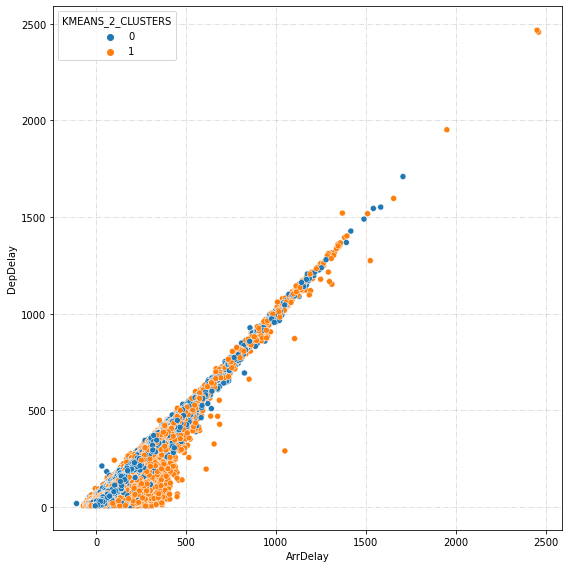

In [28]:
plt.figure(figsize=(8, 8))
sbrn.scatterplot(x='ArrDelay', y='DepDelay', hue='KMEANS_2_CLUSTERS', data=flights_clean)
plt.grid(axis='both', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Compruebo la **distribución de los clusters** en todas las **variables numéricas**, con la esperanza de encontrar una lógica en la agrupación hecha por el modelo:

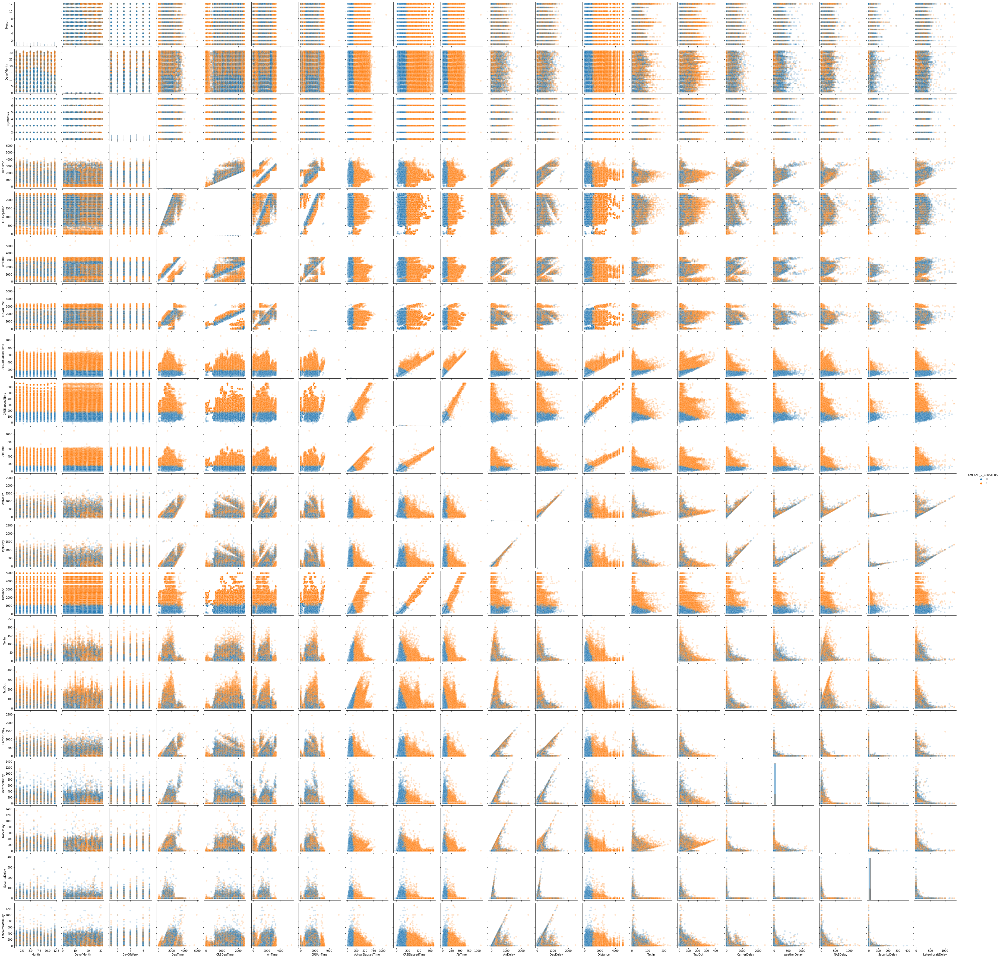

In [29]:
sbrn.pairplot(flights_clean, hue='KMEANS_2_CLUSTERS', diag_kind='hist', plot_kws={'alpha':0.2});

"Ejecuta un pairplot y échate a dormir". Apuesto a que existe una frase similar, xD.   
Pero los resultados son muy interesantes. Parece que la agrupacion está muy basada en la distancia y en el tiempo. La variable **Distance** y las variables **AirTime**, **ActualElapsedTime** y **CRSElapsedTime** tienen cortes muy llamativos de separación entre clusters.  
En principio lo que ha hecho es agrupar vuelos cortos y vuelos largos. Pues tiene sentido, porque los vuelos largos siempre tendrán mas cosas en común entre sí que con los vuelos cortos (y viceversa), independientemente de que lleguen con retraso o no.

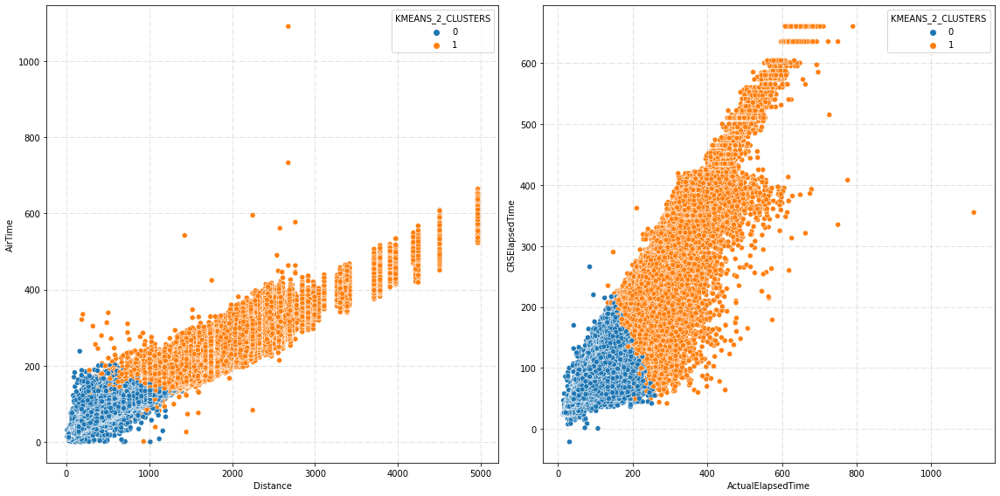

In [10]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(16, 8))
sbrn.scatterplot(x='Distance', y='AirTime', hue='KMEANS_2_CLUSTERS', data=flights_clean, ax=ax1)
sbrn.scatterplot(x='ActualElapsedTime', y='CRSElapsedTime', hue='KMEANS_2_CLUSTERS', data=flights_clean, ax=ax2)
ax1.grid(axis='both', color='gray', linestyle='dashdot', alpha=0.3)
ax2.grid(axis='both', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Compruebo si hay un patrón relacionado con la variable categórica **UniqueCarrier**, pero está claro que el tema va de distancia/tiempo de vuelo:

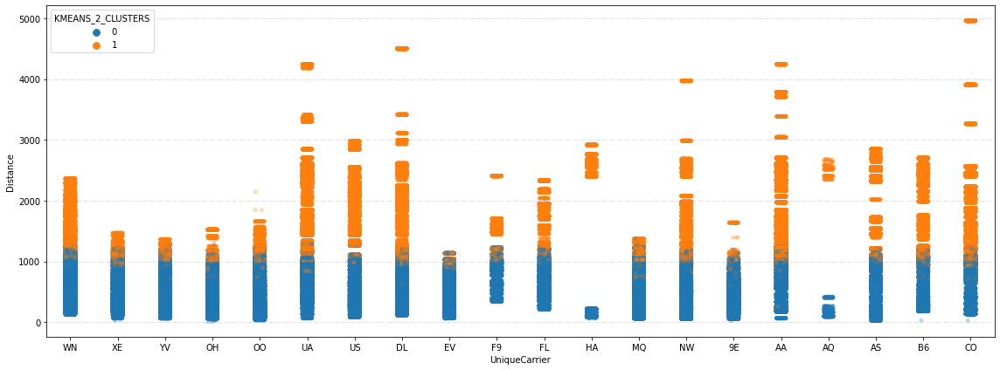

In [22]:
plt.figure(figsize = (16, 6))
sbrn.stripplot(x='UniqueCarrier', y='Distance', hue='KMEANS_2_CLUSTERS', data=flights_clean, alpha=0.3)
plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Lo mismo pasa con la variable "semi-categórica" **DayOfWeek**:

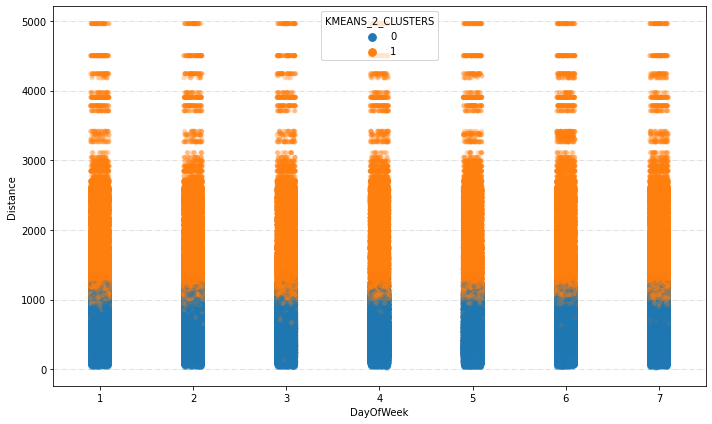

In [23]:
plt.figure(figsize = (10, 6))
sbrn.stripplot(x='DayOfWeek', y='Distance', hue='KMEANS_2_CLUSTERS', data=flights_clean, alpha=0.3)
plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Y con la variable semi-categórica **Month**:

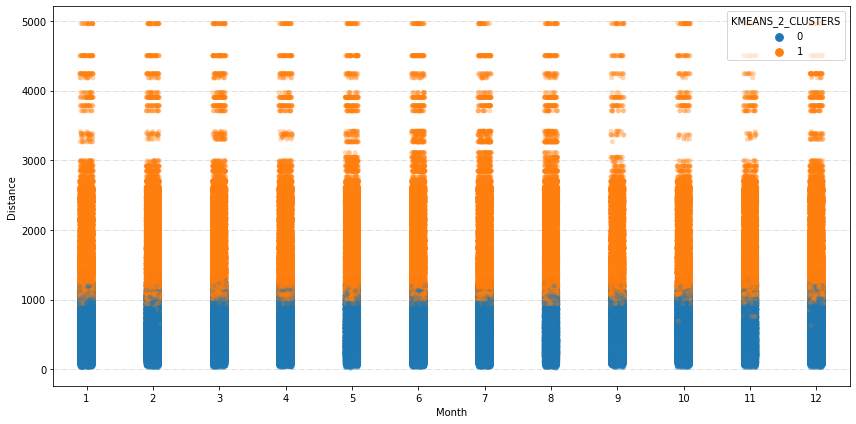

In [24]:
plt.figure(figsize = (12, 6))
sbrn.stripplot(x='Month', y='Distance', hue='KMEANS_2_CLUSTERS', data=flights_clean, alpha=0.3)
plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

> Pues nada, misterio resuelto. Vuelos con **menos de 1000 millas** náuticas y vuelos con **más de 1000 millas** náuticas (mas o menos). Podía haberlo previsto.  
> Espero no haberme cargado este ejercicio con estas pruebas, pero creo que lo interesante de los modelos no supervisados es analizar las agrupaciones, para encontrar patrones que hayan pasado desapercibidos para un "ojo humano" (quizá este dataset no sea el más adecuado para esa tarea, pero bueno).  
> Como ya he comentado, aprovecharé el ejercicio 3 para probar este modelo de forma más "estándar".

---
## Exercici 2
Classifica els diferents vols utilitzant un algorisme de **Clustering Jeràrquic**.

Este ejercicio tuve que hacerlo con un dataframe reducido, con solo un **5%** de los registros del dataframe original, porque el dendograma me devolvia un error de falta de memoria (que no desapareció hasta que reduje el dataframe al 5%).  
Aún así, tenía pensado ejecutar el modelo con todo el dataframe, pero deseché la idea debido a la enorme cantidad de tiempo que tardó el dendograma, a pesar de la reducción (no sé cuantas horas, pero muchas). Así que también ejecuté el modelo sobre el dataframe reducido al 5% (aparte, imagino que también me hubiera devuelto error si lo hubiera intentado con el dataframe completo).  
Lo malo es que de esta forma no puedo comprobar la distribución de los clusters en el dataframe no escalado, ni hacer una comparativa correcta de la métrica **Silhoutte** con la del modelo **K-Means**.

In [2]:
# Importo las librerías que voy a utilizar en este ejercicio:
from scipy.cluster import hierarchy
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

In [11]:
# Importo el dataframe "flights_scaled_pca" (que está guardado como "DelayedFlights_pca.csv":
flights_scaled_pca = pandas.read_csv('./output/DelayedFlights_pca.csv')

Hago una copia reducida del dataframe, al **5%** (mediante la función **sample**) e imprimo un **dendograma**.  
No sé por qué ha impreso también los valores del objeto, que son muchísimos, pero igualmente no puedo volver a ejecutar el comando, ya que ha tardado muchas horas en completarse.

In [22]:
flights_scaled_pca_trunc = flights_scaled_pca.sample(frac=0.05)

{'icoord': [[25.0, 25.0, 35.0, 35.0],
  [15.0, 15.0, 30.0, 30.0],
  [5.0, 5.0, 22.5, 22.5],
  [45.0, 45.0, 55.0, 55.0],
  [85.0, 85.0, 95.0, 95.0],
  [75.0, 75.0, 90.0, 90.0],
  [65.0, 65.0, 82.5, 82.5],
  [50.0, 50.0, 73.75, 73.75],
  [13.75, 13.75, 61.875, 61.875],
  [135.0, 135.0, 145.0, 145.0],
  [125.0, 125.0, 140.0, 140.0],
  [155.0, 155.0, 165.0, 165.0],
  [132.5, 132.5, 160.0, 160.0],
  [115.0, 115.0, 146.25, 146.25],
  [105.0, 105.0, 130.625, 130.625],
  [175.0, 175.0, 185.0, 185.0],
  [195.0, 195.0, 205.0, 205.0],
  [180.0, 180.0, 200.0, 200.0],
  [117.8125, 117.8125, 190.0, 190.0],
  [37.8125, 37.8125, 153.90625, 153.90625],
  [225.0, 225.0, 235.0, 235.0],
  [215.0, 215.0, 230.0, 230.0],
  [245.0, 245.0, 255.0, 255.0],
  [265.0, 265.0, 275.0, 275.0],
  [250.0, 250.0, 270.0, 270.0],
  [285.0, 285.0, 295.0, 295.0],
  [305.0, 305.0, 315.0, 315.0],
  [290.0, 290.0, 310.0, 310.0],
  [260.0, 260.0, 300.0, 300.0],
  [222.5, 222.5, 280.0, 280.0],
  [325.0, 325.0, 335.0, 335.0],
  [3

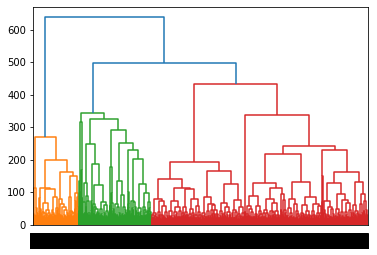

In [24]:
hierarchy.dendrogram(hierarchy.linkage(flights_scaled_pca_trunc, method='ward'))

Ejecuto el modelo **AgglomerativeClustering** sobre el dataframe reducido al 5%.  
Según el dendograma, y si lo he entendido bien, lo correcto sería especificar **4** como valor del parámetro **n_clusters**.

In [4]:
%%time
# Creo una instancia de la función "AgglomerativeClustering", especificando que que cree 4 clusters:
agg_clust = AgglomerativeClustering(n_clusters=4)

# Aplico el modelo sobre el dataframe "flights_scaled_pca_trunc":
agg_clust.fit(flights_scaled_pca_trunc)

Wall time: 18h 57min 38s


AgglomerativeClustering(n_clusters=4)

Obtengo e imprimo la métrica **Silhouette** (lo hago ya en este ejercicio, aprovechando que tengo disponible el objeto correspondiente al modelo):

In [6]:
agg_silhouette = silhouette_score(flights_scaled_pca_trunc, agg_clust.labels_)

print(f"Agglomerative Clustering Silhouette Metric: {agg_silhouette}")

Agglomerative Clustering Silhouette Metric: 0.037787067874246204


> Tremendo. Casi 19 horas ha tardado en ejecutarse el modelo, y el dendograma tres cuartos de lo mismo. Y solo con el 5% del dataframe.  
> Está claro que eso de que los modelos jerárquicos son "exigentes computacionalmente" (que he leído en algún sitio) no es una exageración.  
> Muy justificada tiene que estar la necesidad de decantarse por uno de estos modelos para que valga la pena tan solo plantearse utilizarlos. Además, tampoco veo clara la conveniencia de ejecutar previamente un dendograma, que tarda tanto tiempo como el propio modelo (y hay quien dice que no debe usarse para seleccionar la cantidad de clusters idónea).

---
## Exercici 3
Calcula el rendiment del clustering mitjançant un paràmetre, com pot ser **silhouette**.

En este ejercicio utilizaré el **método del codo** para obtener la cantidad idónea de clusters a especificar al modelo **K-Means**.  
Posteriormente volveré a ejecutar el modelo con el número de clusters obtenido (en principio sobre el dataframe completo), y extraeré la métrica **silhouette**.

In [2]:
# Importo las librerías que voy a utilizar en este ejercicio:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [3]:
# Importo el dataframe "flights_scaled_pca" (que está guardado como "DelayedFlights_pca.csv":
flights_scaled_pca = pandas.read_csv('./output/DelayedFlights_pca.csv')

Ejecuto el modelo **K-Means** en bucle, sobre el dataframe **flights_scaled_pca**, y con valores del parámetro **n_clusters** de **2** a **8**, y en cada ejecución almaceno el valor de **SSE** (Sum of Squared Error), mediante el atributo **inertia_**.

In [4]:
%%time
# Declaro una lista vacía, para almacenar los valores "SSE":
sse_list = []

# Ejecuto el modelo "K-Means" en un bucle, con valores del parámetro "n_clusters" de "2" a "8",
#   y almaceno el "SSE" en cada ejecución, en "sse_list":
for cluster_num in range(2, 9):
    kmeans = KMeans(n_clusters=cluster_num)
    kmeans.fit(flights_scaled_pca)
    sse_list.append(kmeans.inertia_)

Wall time: 4min 13s


Hago un gráfico con los valores de **SSE** almacenados, para comprobar la cantidad idónea de clusters mediante el **método del codo**:

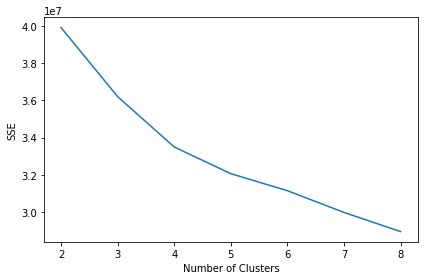

In [5]:
plt.plot(range(2, 9), sse_list)
plt.xticks(range(2, 9))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.tight_layout();

No veo del todo claro cual sería el número idóneo de clusters, así que utilizo la librería **KneeLocator** para comprobarlo:

In [7]:
from kneed import KneeLocator

knee = KneeLocator(range(2, 9), sse_list, curve='convex', direction='decreasing')

knee.elbow

4

Vuelvo a ejecutar el modelo **K-Means**, especificando que cree **4 clusters**:

In [17]:
%%time
# Creo una instancia de la función "KMeans", especificando que que cree 4 clusters:
kmeans = KMeans(n_clusters=4)

# Aplico el modelo sobre el dataframe "flights_scaled_pca":
kmeans.fit(flights_scaled_pca)

Wall time: 21.7 s


KMeans(n_clusters=4)

Obtengo e imprimo la métrica **Silhouette**.  
Por cierto, no entiendo por qué la extracción de esta métrica tarda tanto tiempo con el modelo **K-Means**, y solo unos minutos con el modelo **Agglomerative Clustering** (al revés que lo que tarda la ejecución de los modelos).

In [20]:
%%time
kmeans_silhouette = silhouette_score(flights_scaled_pca, kmeans.labels_)

print(f"K-Means Silhouette Metric: {kmeans_silhouette}")

K-Means Silhouette Metric: 0.12054682344353068
Wall time: 11h 48min 53s


Hago un gráfico para comparar las métricas **Silhouette** de los modelos **K-Means** y **Agglomerative Clustering** que he obtenido en las pruebas,.  
No sé como de válida es la comparación, porque el segundo modelo lo ejecuté sobre el dataframe reducido al 5% (aparte de que esta métrica tampoco es determinante para comparar modelos).

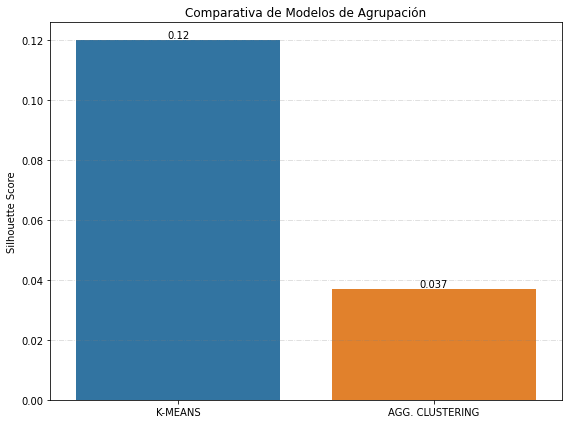

In [29]:
plt.figure(figsize = (8, 6))

ax = sbrn.barplot(x=['K-MEANS','AGG. CLUSTERING'], y=[0.120, 0.037], dodge=False)

for container in ax.containers:
    ax.bar_label(container)

plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.title("Comparativa de Modelos de Agrupación")
plt.ylabel('Silhouette Score')
plt.tight_layout();

> El modelo **K-Means** obtuvo un valor mejor que el modelo **Agglomerative Clustering**, pero los dos resultados son malos, si no me equivoco.

Ya puestos, voy a comprobar la distribución de los clusters en el dataframe **flights_clean**, que no está escalado ni reducido (como hice en el ejercicio 1), así que **concateno los labels** con el dataframe:

In [21]:
# Almaceno los "labels" devueltos por el modelo en un dataframe:
clusters_df = pandas.DataFrame(data=kmeans.labels_, columns=['KMEANS_4_CLUSTERS'])

# Guardo el dataframe "clusters_df" en un archivo CSV:
clusters_df.to_csv('./output/clusters_df.csv', index=False)

# Importo el dataframe "flights_clean" (que en este caso está guardado como "DelayedFlights_clean3.csv":
flights_clean = pandas.read_csv('./output/DelayedFlights_clean3.csv')

# Concateno el dataframe "flights_clean" con el dataframe "clusters_df":
flights_clean = pandas.concat([flights_clean, clusters_df], axis='columns')

flights_clean

,Month,DayofMonth,DayOfWeek,DepTime,CRSDepTime,ArrTime,CRSArrTime,UniqueCarrier,ActualElapsedTime,CRSElapsedTime,...,Dest,Distance,TaxiIn,TaxiOut,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay,KMEANS_4_CLUSTERS
0,1,3,4,2003,1955,2211,2225,WN,128,150,...,TPA,810,4,8,0,0,0,0,0,3
1,1,3,4,754,735,1002,1000,WN,128,145,...,TPA,810,5,10,0,0,0,0,0,1
2,1,3,4,628,620,804,750,WN,96,90,...,BWI,515,3,17,0,0,0,0,0,1
3,1,3,4,1829,1755,1959,1925,WN,90,90,...,BWI,515,3,10,2,0,0,0,32,3
4,1,3,4,1940,1915,2121,2110,WN,101,115,...,JAX,688,4,10,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1928366,12,13,6,1250,1220,1617,1552,DL,147,152,...,ATL,906,9,18,3,0,0,0,22,1
1928367,12,13,6,657,600,904,749,DL,127,109,...,ATL,481,15,34,0,57,18,0,0,1
1928368,12,13,6,1007,847,1149,1010,DL,162,143,...,IAH,689,8,32,1,0,19,0,79,1
1928369,12,13,6,1251,1240,1446,1437,DL,115,117,...,ATL,533,13,13,0,0,0,0,0,1


Compruebo la **cantidad de registros por cada cluster**:

In [22]:
flights_clean['KMEANS_4_CLUSTERS'].value_counts()

3    802894
1    655485
0    291247
2    178745
Name: KMEANS_4_CLUSTERS, dtype: int64

Compruebo la **distribución de los clusters** en las variables **Distance**, **AirTime**, **ActualElapsedTime**, y **CRSElapsedTime**.  
No es tan explícita como en el modelo en el que creamos 2 clusters.

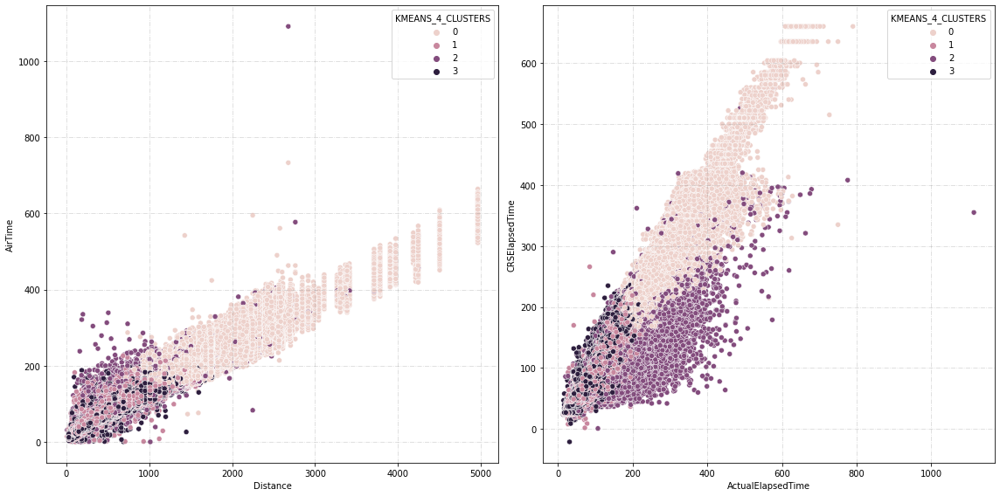

In [30]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(16, 8))
sbrn.scatterplot(x='Distance', y='AirTime', hue='KMEANS_4_CLUSTERS', data=flights_clean, ax=ax1)
sbrn.scatterplot(x='ActualElapsedTime', y='CRSElapsedTime', hue='KMEANS_4_CLUSTERS', data=flights_clean, ax=ax2)
ax1.grid(axis='both', color='gray', linestyle='dashdot', alpha=0.3)
ax2.grid(axis='both', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Compruebo la distribución de los clusters en la variable **UniqueCarrier**:

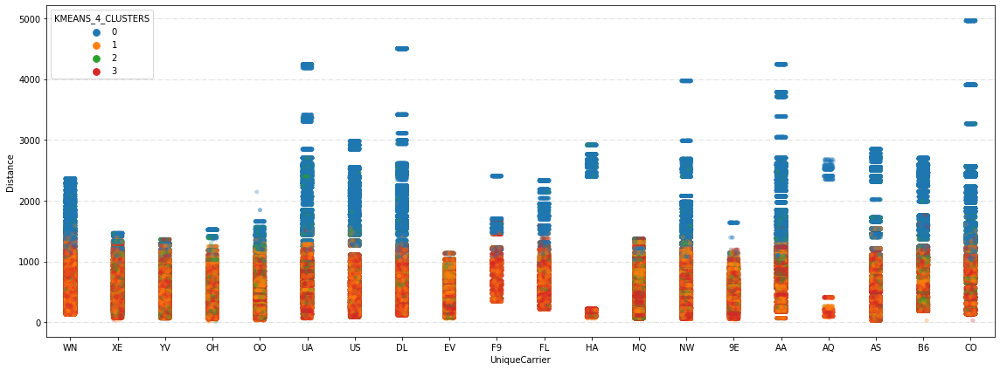

In [31]:
plt.figure(figsize = (16, 6))
sbrn.stripplot(x='UniqueCarrier', y='Distance', hue='KMEANS_4_CLUSTERS', data=flights_clean, alpha=0.3)
plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Compruebo la distribución de los clusters en la variable **DayOfWeek**:

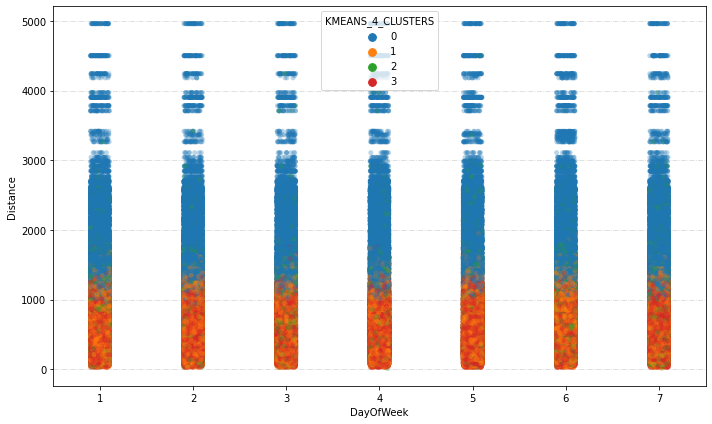

In [32]:
plt.figure(figsize = (10, 6))
sbrn.stripplot(x='DayOfWeek', y='Distance', hue='KMEANS_4_CLUSTERS', data=flights_clean, alpha=0.3)
plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

Compruebo la distribución de los clusters en la variable **Month**:

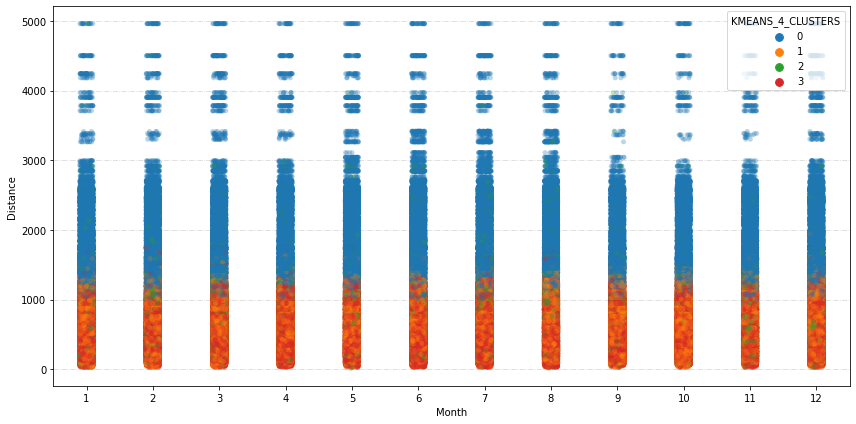

In [34]:
plt.figure(figsize = (12, 6))
sbrn.stripplot(x='Month', y='Distance', hue='KMEANS_4_CLUSTERS', data=flights_clean, alpha=0.3)
plt.grid(axis='y', color='gray', linestyle='dashdot', alpha=0.3)
plt.tight_layout();

> Parece que uno de los clusters sigue ocupando la franja de distancia superior a **1000 millas náuticas** (mas o menos), y los demás comparten la franja inferior a dicha distancia.  
> Para identificar el patrón de agrupación de esos 3 clusters habría que hacer un **paiplot**, y buscar cortes llamativos en las variables, pero con lo que tarda en ejecutarse en un dataframe de estas dimensiones (y las horas que llevo invertidas en este ejercicio), creo que lo podemos dejar por aquí, xD.

---
## Ejercicio Extra
A pesar de todo, quiero probar el modelo **DBSCAN** antes de dejar el ejercico (cruzando los dedos para que no se tire la vida), entre otras cosas porque decide cuántos clusters crear por sí mismo.

In [2]:
# Importo las librerias que voy a utilizar en este ejercicio:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [3]:
# Importo el dataframe "flights_scaled_pca" (que está guardado como "DelayedFlights_pca.csv":
flights_scaled_pca = pandas.read_csv('./output/DelayedFlights_pca.csv')

Ejecuto el modelo sobre el dataframe completo:

In [4]:
%%time
# Creo una instancia de la función "DBSCAN":
dbscan = DBSCAN()

# Aplico el modelo sobre el dataframe "flights_scaled_pca":
dbscan.fit(flights_scaled_pca)

Wall time: 9h 52min 41s


DBSCAN()

Antes que nada, **guardo los labels** devueltos por el modelo, para analizarlos posteriormente:

In [5]:
# Almaceno los "labels" devueltos por el modelo en un dataframe:
clusters_df = pandas.DataFrame(data=dbscan.labels_, columns=['DBSCAN_CLUSTERS'])

# Guardo el dataframe "clusters_df" en un archivo CSV:
clusters_df.to_csv('./output/clusters_df.csv', index=False)

Intenté obtener la métrica **Silhouette**, pero al final detuve la ejecución, despues de varias horas.  
Lo curioso es que cuando compruebo los clusters creados por el modelo me encuentro que ha creado **2231**, con criterios que no voy a analizar (y casi creo que no es posible hacerlo).

In [7]:
# Importo el dataframe "flights_clean" (que en este caso está guardado como "DelayedFlights_clean3.csv":
flights_clean = pandas.read_csv('./output/DelayedFlights_clean3.csv')

# Concateno el dataframe "flights_clean" con el dataframe "clusters_df":
flights_clean = pandas.concat([flights_clean, clusters_df], axis='columns')

In [8]:
# Compruebo la cantidad de valores únicos de la columna 'DBSCAN_CLUSTERS':
flights_clean['DBSCAN_CLUSTERS'].value_counts()

-1       1867153
 1           435
 526         408
 476         381
 180         364
          ...   
 1824          2
 520           2
 1708          2
 617           2
 743           2
Name: DBSCAN_CLUSTERS, Length: 2231, dtype: int64

In [9]:
flights_clean['DBSCAN_CLUSTERS'].nunique()

2231

> La verdad es que esperaba mucho más de este modelo, y de todos los modelos de este ejercicio en general. El tiempo de ejecución, por una razón u otra, es directamente inasumible.  
> Aún así, **K-Means** puede ser una buena opción para hacer una agrupación rápida (pero sin extraer la métrica **Silhouette**, que tira por tierra la velocidad de ejecución del modelo), y luego analizar la distribución de los clusters.

---